# Laplacian Filter


- it is an edge detector used to compute the second derivative of an image, measuring the rate at which the first derivatives change. <br>
- In first order derivative filters, it detects the edge along with horizontal and vertical directions separately and then combine both. However, in using Laplacian filter, it detects the edges in the whole image at once. 

- In Sobel filter, it works by taking one derivative and find an edge on either the x or y. However, in Laplacian filter, it can get the edges in both dimensions by taking second derivative of the intensities. As seen on the graph, it points to zero. The pixels that leads to zero will be marked as the edge points.

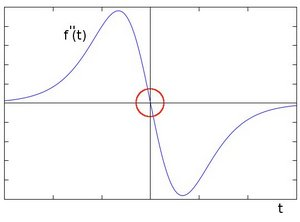

- The Laplacian Operator is defined by:

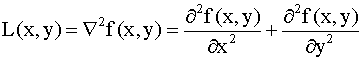

- Laplacian filter kernels usually contain negative values in a cross pattern, centered within the array. The corners are either zero or positive values. The center value can be either negative or positive. The following are the most common example of a 3x3 kernel for a Laplacian filter.

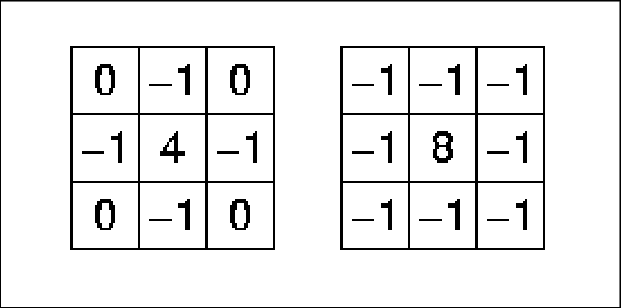

## Steps to implement Laplacian Filter

### Step 1. Open Jupyter Notebook/VS Code/ Google Colab

### Step 2. Create a new Python file.

### Step 3. Import the necessary libraries.

In [1]:
import cv2 #to read the image in grayscale and for other methods
import matplotlib.pyplot as plt #to make some changes to a figure

### Step 4. Load the image

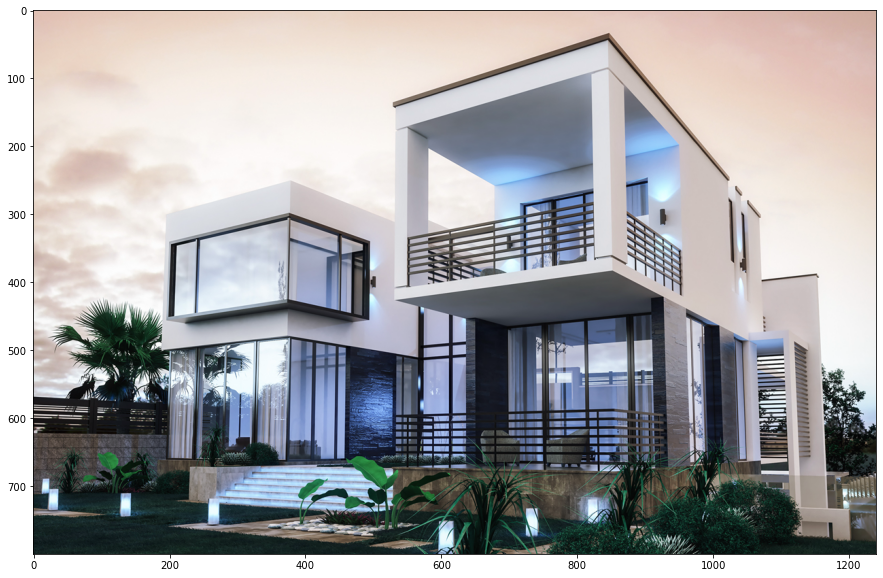

In [2]:
img = cv2.imread('house.jpg') #read the image
plt.figure(figsize=(20,10)) #set the image size
plt.imshow(img) #show the image

### Step 5. Apply Gaussian Blur

- Laplacian filter is a bit sensitive to noise. In order to fix this, we will apply the Gaussian Blur because it will smoothen the image and will make the Laplacian filter more effective. <br>
- We can use the method GaussianBlur() of cv2 to apply this.

- cv2.GaussianBlur(src, ksize, sigmaX, sigmaY, borderType)
    - src: Input image <br>
    - ksize: Gaussian Kernel Size [height,width]. height and width should be odd and can have different values. If ksize is set to [0 0], then ksize is computed from sigma values.
    - sigmaX:Standard deviation value of kernal along horizontal direction. <br>
    - sigmaY: Standard deviation value of kernal along vertical direction. <br>
    - borderType: Specifies image boundaries while kernel is applied on image borders. Possible values are : cv.BORDER_CONSTANT cv.BORDER_REPLICATE cv.BORDER_REFLECT cv.BORDER_WRAP cv.BORDER_REFLECT_101 cv.BORDER_TRANSPARENT cv.BORDER_REFLECT101 cv.BORDER_DEFAULT cv.BORDER_ISOLATED

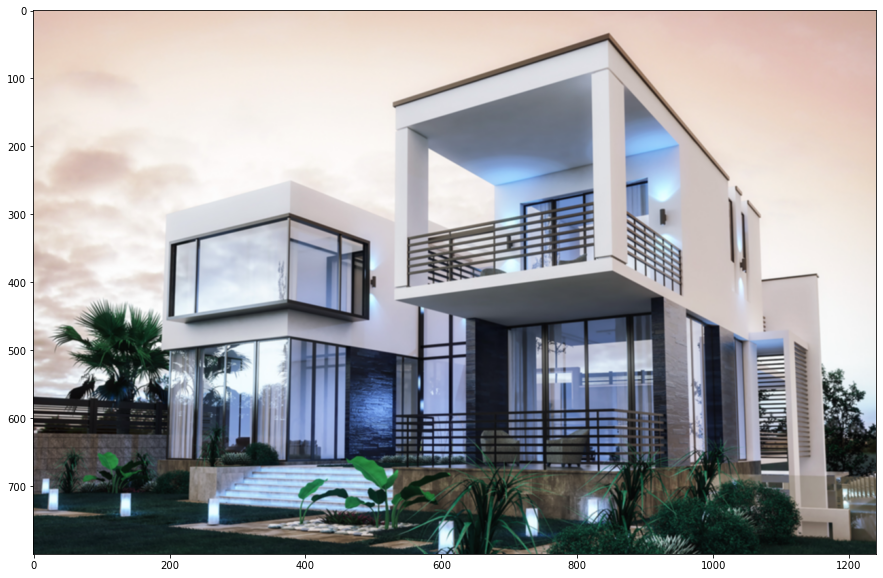

In [3]:
img = cv2.GaussianBlur(img,(3,3),0) #applying gaussian blur to image
plt.figure(figsize=(20,10)) #set the image size
plt.imshow(img) #show the image

### Step 6. Convert the image to grayscale

- Using cvtColor() method, we can change an image to grayscale.
- cv2.cvtColor(image, code, dst, dstCn)
    - image: Source/Input image <br>
    - code: Conversion code for color space. <br>
    - dst: Output image of the same size and depth as source. <br>
    - dstCn: The number of channels in the destination image. If you put parameter as 0, the number of the channels is obtained automatically from image and code.

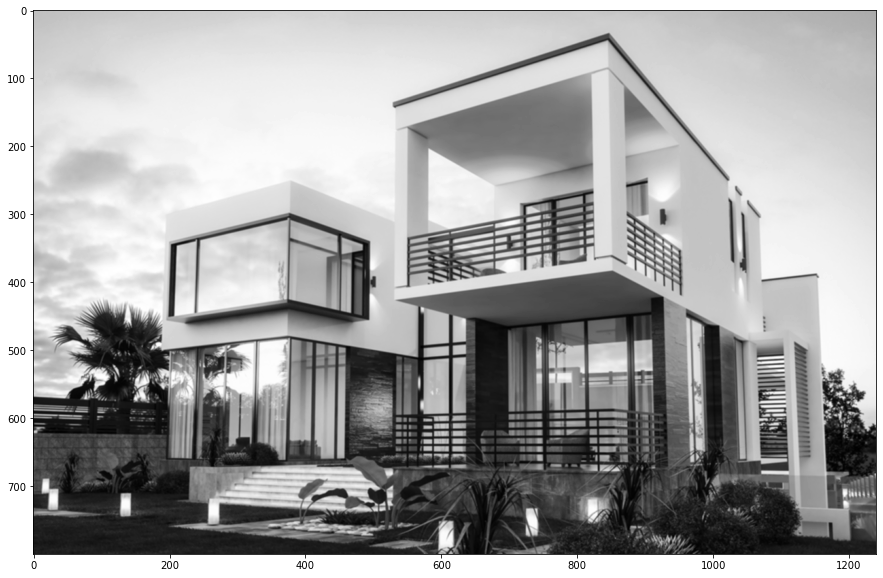

In [4]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #converting image to grayscale
plt.figure(figsize=(20,10)) #set the image size
plt.imshow(img_gray, cmap='gray') #show the image

### Step 7. Apply the Laplacian Filter

- Laplacian operator is implemented by the function Laplacian() <br>
- Laplacian(src, dst, ddepth, kernel_size, scale, delta, BORDER_DEFAULT)<br>
    - src_gray: Input image.<br>
    - dst: Destination (output) image<br>
    - ddepth: The data type of the output image. Since our input is CV_8U we define ddepth = CV_16S to avoid overflow<br>
    - kernel_size: The size of the kernel matrix <br>
    - scale, delta and BORDER_DEFAULT: We leave them as default values. <br>
- 

In [5]:
laplacian = cv2.Laplacian(img_gray, cv2.CV_16S, ksize=3) #apply laplacian filter
final = cv2.convertScaleAbs(laplacian) #converting back to CV_8U

### Step 8. Show the output image

True

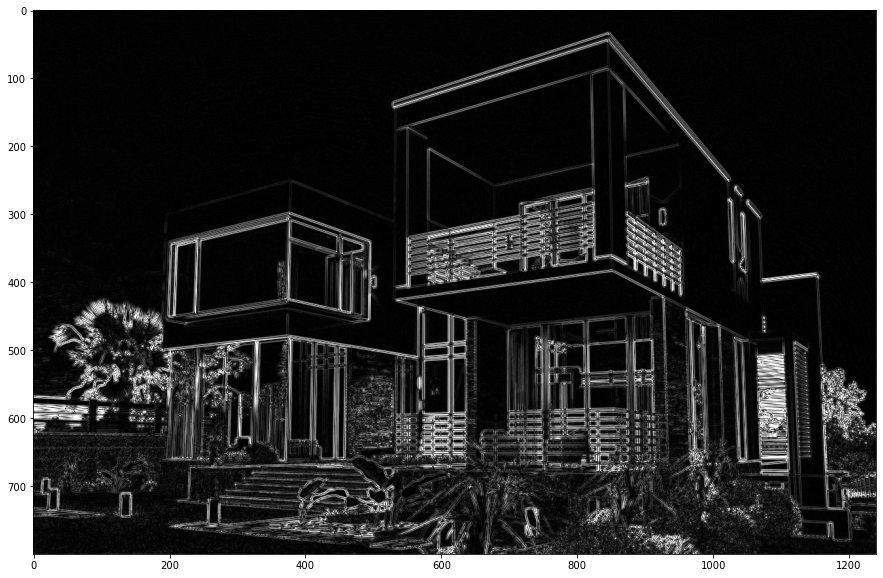

In [6]:
plt.figure(figsize=(20,10)) #set the image size
plt.imshow(final, cmap='gray') #show the image

cv2.imwrite('1.jpg', final) #to save the image to the folder

## Performance Metrics Evaluation

In [9]:
from sewar import full_ref
from skimage import measure, metrics
from skimage.metrics import structural_similarity as ssim

### 3X3

In [10]:
orig = cv2.imread('house.jpg')
laplacian = cv2.imread('1.jpg')

### MSE, SSIM, RMSE, PSNR

In [11]:
mse_skimg = metrics.mean_squared_error(orig, laplacian)
ssim_skimg = ssim(orig, laplacian, data_range = img.max() - img.min(), multichannel = True)
rmse_skimg = metrics.normalized_root_mse(orig, laplacian)
psnr_skimg = metrics.peak_signal_noise_ratio(orig, laplacian, data_range=None)
print("MSE: based on scikit-image = ", mse_skimg)
print("SSIM: based on scikit-image = ", ssim_skimg)
print("RMSE: based on scikit-image = ", rmse_skimg)
print("PSNR: based on scikit-image = ", psnr_skimg)

MSE: based on scikit-image =  27699.26081216398
SSIM: based on scikit-image =  0.03898168345209546
RMSE: based on scikit-image =  0.9486853588162859
PSNR: based on scikit-image =  3.706121813154368


### 5X5

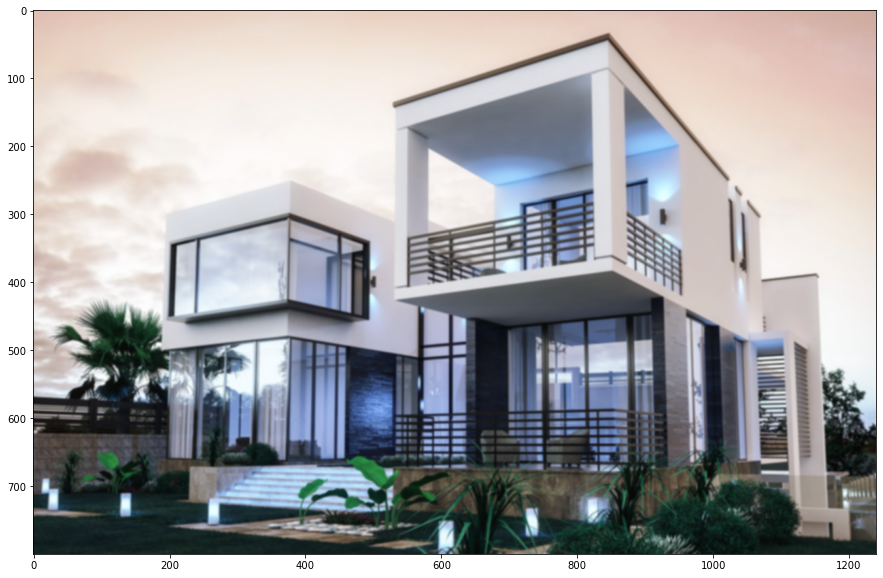

In [12]:
img = cv2.GaussianBlur(img,(5,5),0)
plt.figure(figsize=(20,10)) 
plt.imshow(img) 

True

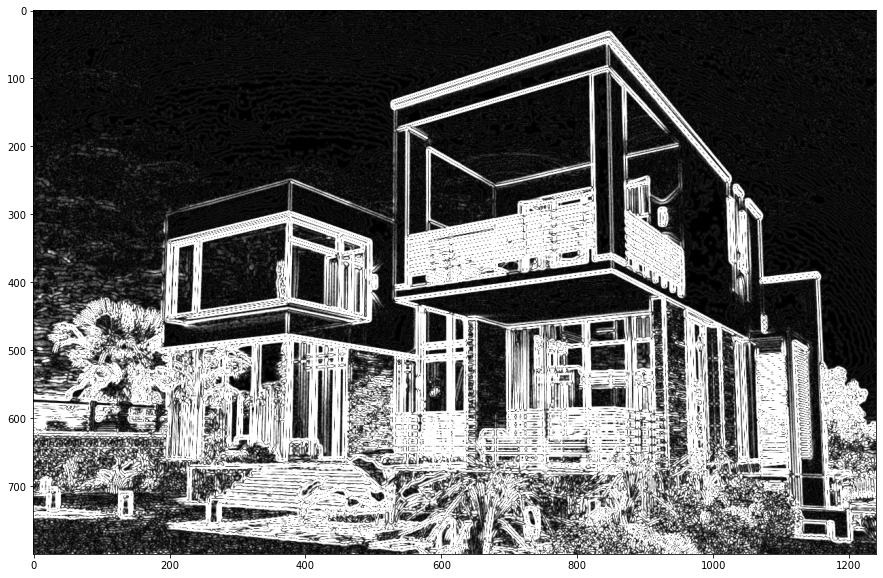

In [13]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
laplacian = cv2.Laplacian(img_gray, cv2.CV_16S, ksize=5) 
final = cv2.convertScaleAbs(laplacian)
plt.figure(figsize=(20,10))
plt.imshow(final, cmap='gray') 

cv2.imwrite('2.jpg', final) 

In [14]:
orig = cv2.imread('house.jpg')
laplacian = cv2.imread('2.jpg')

### MSE, SSIM, RMSE, PSNR

In [15]:
mse_skimg = metrics.mean_squared_error(orig, laplacian)
ssim_skimg = ssim(orig, laplacian, data_range = img.max() - img.min(), multichannel = True)
rmse_skimg = metrics.normalized_root_mse(orig, laplacian)
psnr_skimg = metrics.peak_signal_noise_ratio(orig, laplacian, data_range=None)
print("MSE: based on scikit-image = ", mse_skimg)
print("SSIM: based on scikit-image = ", ssim_skimg)
print("RMSE: based on scikit-image = ", rmse_skimg)
print("PSNR: based on scikit-image = ", psnr_skimg)

MSE: based on scikit-image =  27732.511757392473
SSIM: based on scikit-image =  0.025120540295387933
RMSE: based on scikit-image =  0.949254601873394
PSNR: based on scikit-image =  3.700911550846872


### 7x7

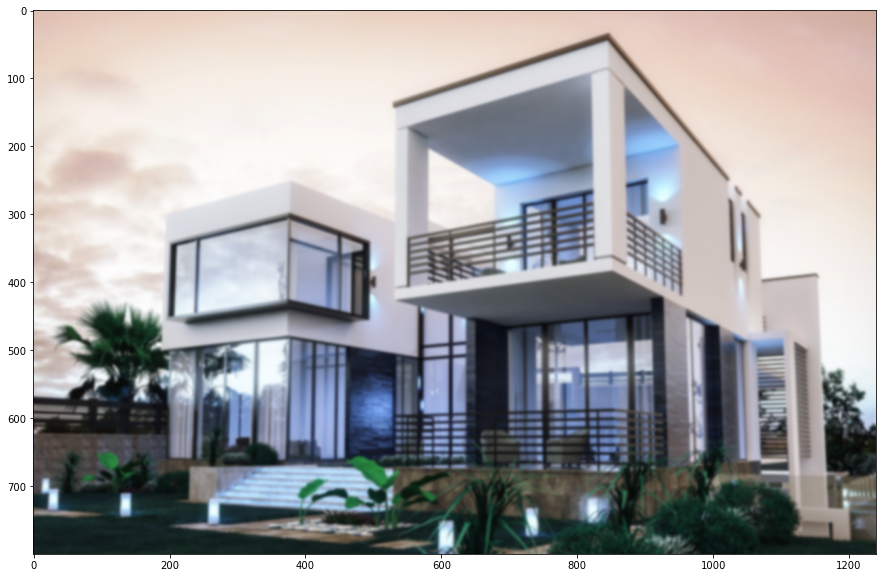

In [16]:
img = cv2.GaussianBlur(img,(7,7),0)
plt.figure(figsize=(20,10)) 
plt.imshow(img) 

True

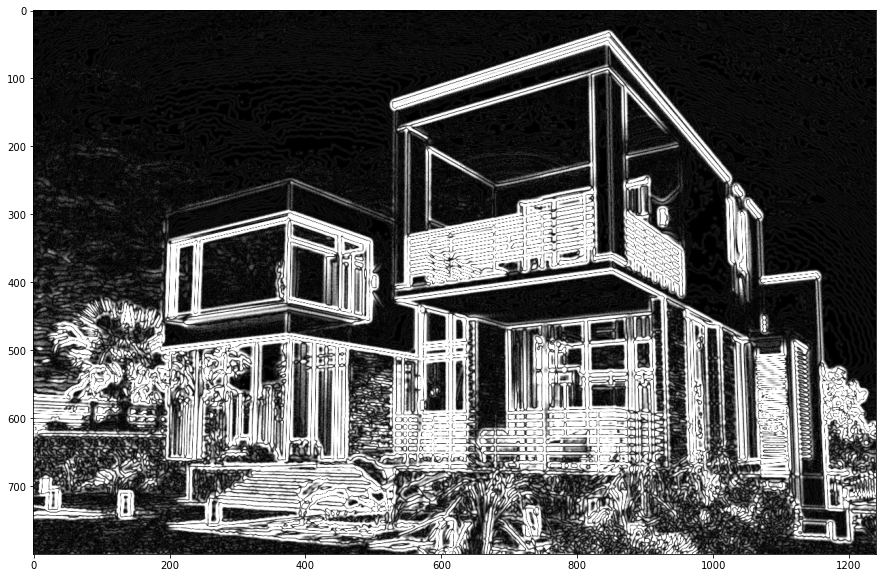

In [17]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
laplacian = cv2.Laplacian(img_gray, cv2.CV_16S, ksize=5)
final = cv2.convertScaleAbs(laplacian) 
plt.figure(figsize=(20,10)) 
plt.imshow(final, cmap='gray') 

cv2.imwrite('3.jpg', final) 

In [18]:
orig = cv2.imread('house.jpg')
laplacian = cv2.imread('3.jpg')

### 7x7

In [19]:
mse_skimg = metrics.mean_squared_error(orig, laplacian)
ssim_skimg = ssim(orig, laplacian, data_range = img.max() - img.min(), multichannel = True)
rmse_skimg = metrics.normalized_root_mse(orig, laplacian)
psnr_skimg = metrics.peak_signal_noise_ratio(orig, laplacian, data_range=None)
print("MSE: based on scikit-image = ", mse_skimg)
print("SSIM: based on scikit-image = ", ssim_skimg)
print("RMSE: based on scikit-image = ", rmse_skimg)
print("PSNR: based on scikit-image = ", psnr_skimg)

MSE: based on scikit-image =  26375.50307795699
SSIM: based on scikit-image =  0.029850965818860615
RMSE: based on scikit-image =  0.9257388380654635
PSNR: based on scikit-image =  3.9187960888834033


## Conclusion

In implementing the Laplacian Filter, there are several steps that need to be done first. The image should be imported first, then gaussian blur will be applied. As seen in the images below, these are the results after applying the gaussian blur to the image. Respectively, these images are 3x3, 5x5, and 7x7 kernel size. Based on my observation, as the kernel size number gets higher, the blur on the image also increases since it is being smoothened.

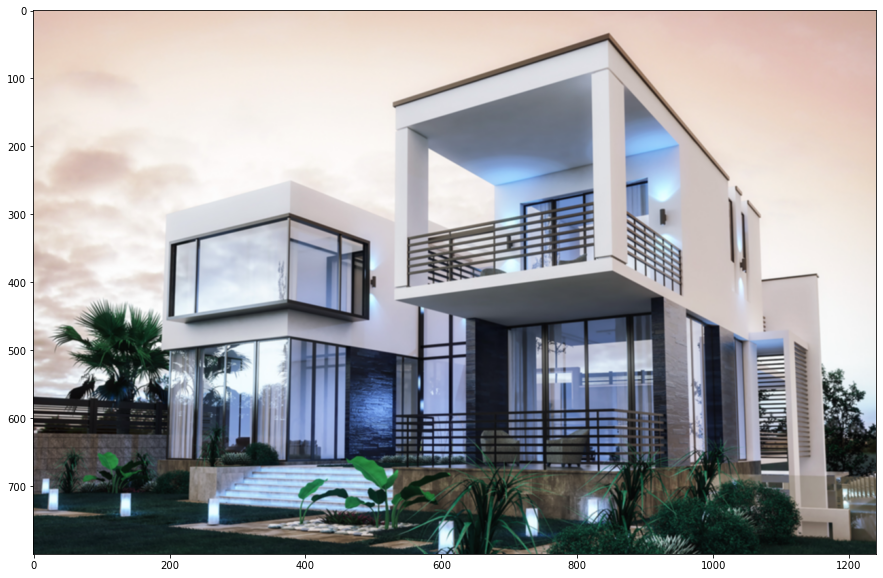

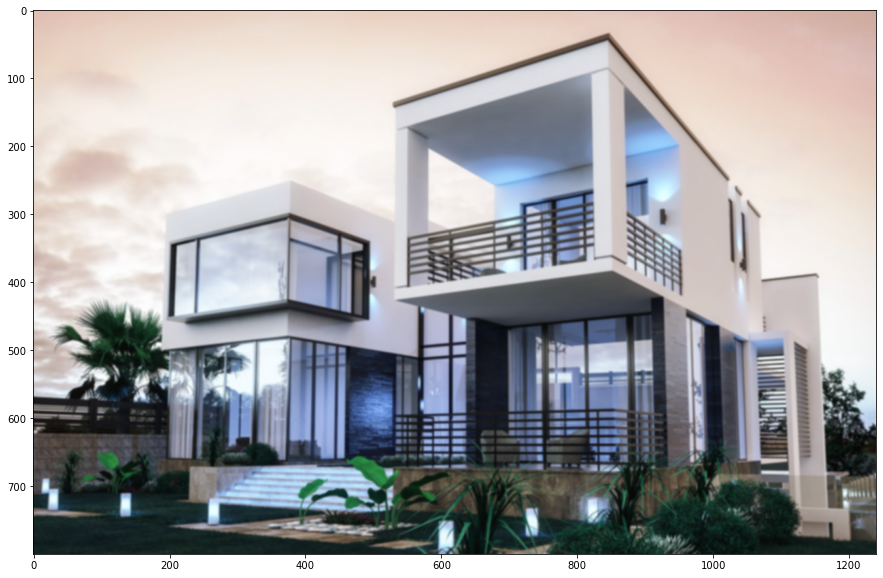

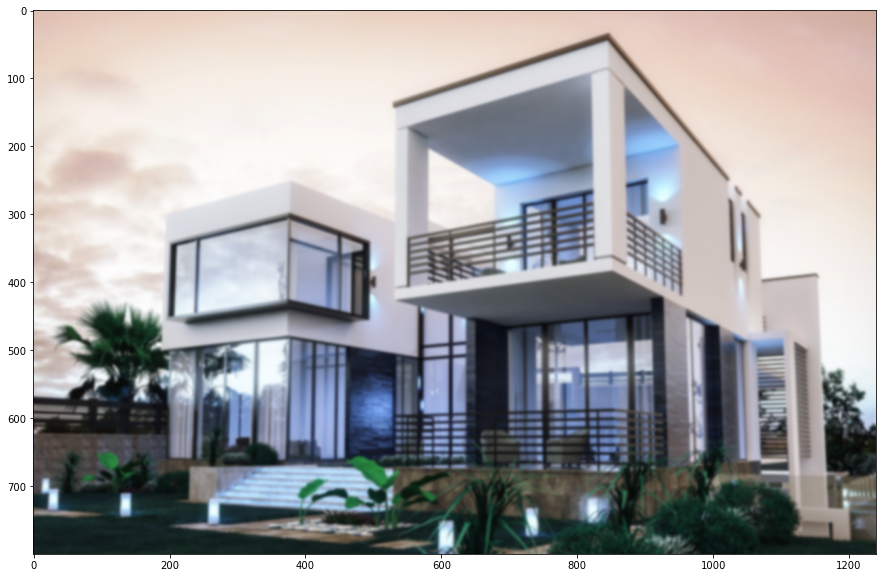

Moving forward, the images below vary from 3x3, 5x5, to 7x7 kernel size. These are the output images after implementing the Laplacian filter. <br> <br>
Based on the result, I can say that as the kernel size number increases, the lines or edges on the image got thicker. As seen in the first image, it looks cleaner compared to the 5x5 and 7x7 kernel sizes. Moreover, if I’m going to compare the 5x5 and 7x7 kernel size results, the 7x7 looks better. <br> <br>
To sum up, the amoutn of edges detected on an image after applying the Laplacian filter depends on how higher or lower the kernel size number is. 

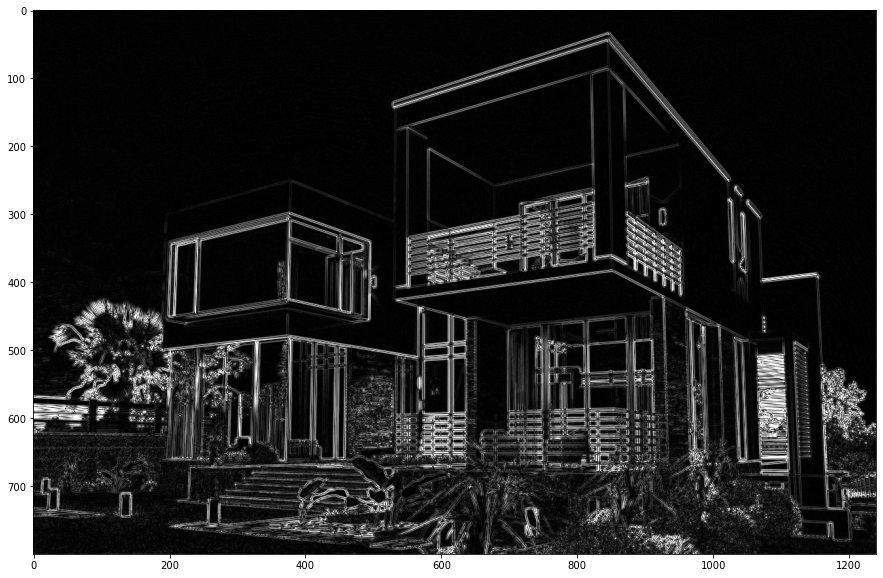

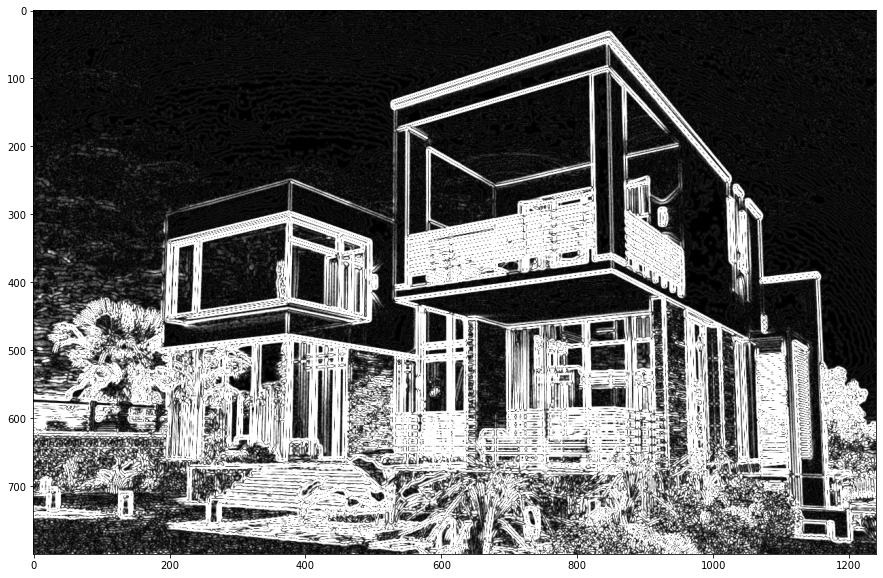

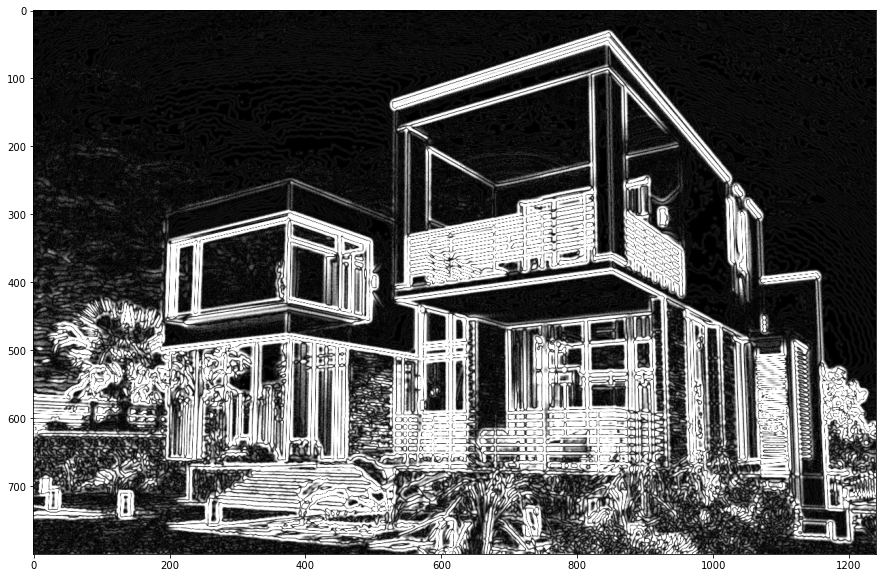

## Table of Experiments for Metrics Evaluation

|Metrics||3x3||5x5||7x7|
|---||---||---||---|
|MSE||27699||27732||26375|
|SSIM||0.0389||0.0251||0.0298|
|RMSE||0.9486||0.942||0.9257|
|PSNR||3.7061||3.7009||3.9187|

In this experiment, I applied the Laplacian Filter to one image (house) and tried to see what the differences in the evaluation of the metric could be if I compare the output image from the Laplacian filter to the original image by changing the kernel size number. <br><br>
As seen in the table, I used 3x3, 5x5, and 7x7 kernel sizes for the image. Initially, for the MSE results, the 5x5 kernel got a bit higher value compared to 3x3 which is almost close, and 7x7 which is a bit lower than both kernel sizes. It is said that “There are no acceptable limits for MSE except that the lower the MSE the higher the accuracy of prediction as there would be an excellent match between the actual and predicted data set.”. Therefore, from this result, I can that among the three, the 7x7 kernel size output image is better to use.<br><br>
Furthermore, for the SSIM results, among the three-kernel size, the 5x5 got a lower value than the 3x3 and 7x7 kernels. The values for SSIM range from 0 to 1, and 1 means a perfect match of the reconstructed image with the original one. Generally, SSIM values 0.97, 0.98, 0.99 for good quality reconstruction techniques. With this, I can say that the results of the three kernels are too low to be considered as good. <br><br>
For the RMSE, the kernels got a high-value result ranging between 92%-94%. However, it is said that “The lower the RMSE, the better a given model is able to “fit” a dataset.” Moreover, it can be said that RMSE values between 0.2 and 0.5 show that the model can relatively predict the data accurately. Therefore, the values that I got from the three kernel sizes are somewhat high to be able to fit the dataset.<br><br>
Finally, for the PSNR results, 3x3 and 5x5 got the same value of 3.70, while the 7x7 kernel is a bit higher with 3.91. It is said that the higher the PSNR, the better the quality of the compressed, or reconstructed image. Among the three, the 7x7 kernel is got a better quality of the image.

#### References:
https://iq.opengenus.org/laplacian-filter/ <br>
https://docs.opencv.org/3.4/d5/db5/tutorial_laplace_operator.html <br>
https://docs.opencv.org/4.x/d5/d0f/tutorial_py_gradients.html